<a href="https://colab.research.google.com/github/Arashhadadsoleymani/Airplane/blob/main/Airplane.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [4]:
import warnings
warnings.filterwarnings('ignore')

In [5]:
train = pd.read_csv('train.csv')
test = pd.read_csv('test.csv')

In [6]:
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.figure_factory as ff

In [7]:
all_data = [train,test]
data_names = ['train','test']

In [8]:
train.head(3)

,Unnamed: 0,id,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,...,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes,satisfaction
0,0,70172,Male,Loyal Customer,13,Personal Travel,Eco Plus,460,3,4,...,5,4,3,4,4,5,5,25,18.0,neutral or dissatisfied
1,1,5047,Male,disloyal Customer,25,Business travel,Business,235,3,2,...,1,1,5,3,1,4,1,1,6.0,neutral or dissatisfied
2,2,110028,Female,Loyal Customer,26,Business travel,Business,1142,2,2,...,5,4,3,4,4,4,5,0,0.0,satisfied


In [9]:
test.head(3)

,Unnamed: 0,id,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,...,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes,satisfaction
0,0,19556,Female,Loyal Customer,52,Business travel,Eco,160,5,4,...,5,5,5,5,2,5,5,50,44.0,satisfied
1,1,90035,Female,Loyal Customer,36,Business travel,Business,2863,1,1,...,4,4,4,4,3,4,5,0,0.0,satisfied
2,2,12360,Male,disloyal Customer,20,Business travel,Eco,192,2,0,...,2,4,1,3,2,2,2,0,0.0,neutral or dissatisfied


In [10]:
for data in all_data :
  data.drop(columns=['Unnamed: 0'],inplace=True)

In [11]:
train.describe()

,id,Age,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,Gate location,Food and drink,Online boarding,Seat comfort,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes
count,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103594.000000
mean,64924.210502,39.379706,1189.448375,2.729683,3.060296,2.756901,2.976883,3.202129,3.250375,3.439396,3.358158,3.382363,3.351055,3.631833,3.304290,3.640428,3.286351,14.815618,15.178678
std,37463.812252,15.114964,997.147281,1.327829,1.525075,1.398929,1.277621,1.329533,1.349509,1.319088,1.332991,1.288354,1.315605,1.180903,1.265396,1.175663,1.312273,38.230901,38.698682
min,1.000000,7.000000,31.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,32533.750000,27.000000,414.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,3.000000,3.000000,3.000000,2.000000,0.000000,0.000000
50%,64856.500000,40.000000,843.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,4.000000,4.000000,4.000000,4.000000,4.000000,3.000000,4.000000,3.000000,0.000000,0.000000
75%,97368.250000,51.000000,1743.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,5.000000,4.000000,4.000000,4.000000,5.000000,4.000000,5.000000,4.000000,12.000000,13.000000
max,129880.000000,85.000000,4983.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,1592.000000,1584.000000


In [12]:
test.describe()

,id,Age,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,Gate location,Food and drink,Online boarding,Seat comfort,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes
count,25976.000000,25976.000000,25976.000000,25976.000000,25976.000000,25976.000000,25976.000000,25976.000000,25976.000000,25976.000000,25976.000000,25976.000000,25976.000000,25976.000000,25976.000000,25976.000000,25976.000000,25976.00000,25893.000000
mean,65005.657992,39.620958,1193.788459,2.724746,3.046812,2.756775,2.977094,3.215353,3.261665,3.449222,3.357753,3.385664,3.350169,3.633238,3.314175,3.649253,3.286226,14.30609,14.740857
std,37611.526647,15.135685,998.683999,1.335384,1.533371,1.412951,1.282133,1.331506,1.355536,1.320090,1.338299,1.282088,1.318862,1.176525,1.269332,1.180681,1.319330,37.42316,37.517539
min,17.000000,7.000000,31.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,0.00000,0.000000
25%,32170.500000,27.000000,414.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,3.000000,3.000000,3.000000,2.000000,0.00000,0.000000
50%,65319.500000,40.000000,849.000000,3.000000,3.000000,3.000000,3.000000,3.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,3.000000,4.000000,3.000000,0.00000,0.000000
75%,97584.250000,51.000000,1744.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,5.000000,4.000000,4.000000,4.000000,5.000000,4.000000,5.000000,4.000000,12.00000,13.000000
max,129877.000000,85.000000,4983.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,1128.00000,1115.000000


In [13]:
for data , name in zip(all_data,data_names) :
  print(f'{name} shape is : ',data.shape)

train shape is :  (103904, 24)
test shape is :  (25976, 24)


In [14]:
for data , name in zip(all_data,data_names) :
  print(f'{name} missing values are : \n')
  print((data.isnull().sum()*100/len(data)).sort_values(ascending=False))
  print(' ')

train missing values are : 

Arrival Delay in Minutes             0.298352
id                                   0.000000
Gender                               0.000000
Departure Delay in Minutes           0.000000
Cleanliness                          0.000000
Inflight service                     0.000000
Checkin service                      0.000000
Baggage handling                     0.000000
Leg room service                     0.000000
On-board service                     0.000000
Inflight entertainment               0.000000
Seat comfort                         0.000000
Online boarding                      0.000000
Food and drink                       0.000000
Gate location                        0.000000
Ease of Online booking               0.000000
Departure/Arrival time convenient    0.000000
Inflight wifi service                0.000000
Flight Distance                      0.000000
Class                                0.000000
Type of Travel                       0.000000
Age  

In [15]:
for data , name in zip(all_data,data_names) :
  print(f'{name} info : \n')
  print(data.info())
  print(' ')

train info : 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 103904 entries, 0 to 103903
Data columns (total 24 columns):
 #   Column                             Non-Null Count   Dtype  
---  ------                             --------------   -----  
 0   id                                 103904 non-null  int64  
 1   Gender                             103904 non-null  object 
 2   Customer Type                      103904 non-null  object 
 3   Age                                103904 non-null  int64  
 4   Type of Travel                     103904 non-null  object 
 5   Class                              103904 non-null  object 
 6   Flight Distance                    103904 non-null  int64  
 7   Inflight wifi service              103904 non-null  int64  
 8   Departure/Arrival time convenient  103904 non-null  int64  
 9   Ease of Online booking             103904 non-null  int64  
 10  Gate location                      103904 non-null  int64  
 11  Food and drink          

In [16]:
for data , name in zip(all_data,data_names) :
  print(f'{name} columns : \n')
  print(data.columns)
  print(' ')

train columns : 

Index(['id', 'Gender', 'Customer Type', 'Age', 'Type of Travel', 'Class',
       'Flight Distance', 'Inflight wifi service',
       'Departure/Arrival time convenient', 'Ease of Online booking',
       'Gate location', 'Food and drink', 'Online boarding', 'Seat comfort',
       'Inflight entertainment', 'On-board service', 'Leg room service',
       'Baggage handling', 'Checkin service', 'Inflight service',
       'Cleanliness', 'Departure Delay in Minutes', 'Arrival Delay in Minutes',
       'satisfaction'],
      dtype='object')
 
test columns : 

Index(['id', 'Gender', 'Customer Type', 'Age', 'Type of Travel', 'Class',
       'Flight Distance', 'Inflight wifi service',
       'Departure/Arrival time convenient', 'Ease of Online booking',
       'Gate location', 'Food and drink', 'Online boarding', 'Seat comfort',
       'Inflight entertainment', 'On-board service', 'Leg room service',
       'Baggage handling', 'Checkin service', 'Inflight service',
       'Cleanli

EDA : Exploratory Data Analysis

In [17]:
fig = px.histogram(train,x='satisfaction',color='satisfaction',barmode='group',color_discrete_map={'satisfied':'lightblue','neutral or dissatisfied':'#E44242'})
fig.update_layout(title='<b>Distribution of satisfied and dissatisfied passengers<b>',title_font={'size':25},paper_bgcolor='lightgrey',plot_bgcolor='lightgrey',showlegend=True)
fig.update_traces(marker_line_color='brown',marker_line_width=0.5,opacity=0.6)

In [18]:
gender_satisfaction = train.groupby(['satisfaction'])['Gender'].value_counts().unstack()
gender_satisfaction

Gender,Female,Male
satisfaction,,
neutral or dissatisfied,30193,28686
satisfied,22534,22491


In [19]:
type(gender_satisfaction)

pandas.core.frame.DataFrame

(-1.0999999980597919,
 1.099999999907609,
 -1.0999918660562475,
 1.099998496231309)

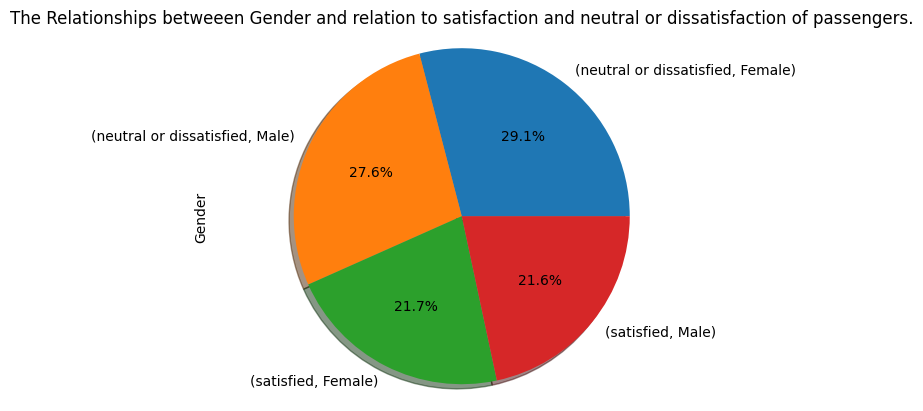

In [20]:
train.groupby('satisfaction')['Gender'].value_counts().plot.pie(autopct='%1.1f%%',shadow=True)
plt.title('The Relationships betweeen Gender and relation to satisfaction and neutral or dissatisfaction of passengers.')
plt.axis('equal')

In [21]:
satisfied = train[train['satisfaction'] == 'satisfied']
neutral_or_diss_satisfied = train[train['satisfaction'] == 'neutral or dissatisfied']

fig = go.Figure()
fig.add_trace(go.Violin(x=satisfied['Age'],line_color='lightseagreen',y0=0,name='satisfied passengers age'))
fig.add_trace(go.Violin(x=neutral_or_diss_satisfied['Age'],line_color='red',y0=0,name='neutral or dissatisfied passengers age'))

fig.update_traces(orientation='h',side='positive',meanline_visible=True)

fig.update_layout(title='<b>Distribution of satisfied and neutral or dissatisfied passengers based on their age<b>',title_font={'size':25},xaxis_zeroline=False,paper_bgcolor='lightgrey',plot_bgcolor='lightgrey')

fig.update_xaxes(showgrid=False,title='<b>Age<b>')
fig.update_traces(opacity=0.7)

In [22]:
fig = make_subplots(rows=1,cols=2,specs=[[{'type':'domain'},{'type':'domain'}]],subplot_titles=['Customer Type Distribution','Type of Travel Distribution'])
fig.add_trace(go.Pie(labels=train['Customer Type'],hole=.3,title='Customer Type',titlefont={'size':24}),row=1,col=1)
fig.add_trace(go.Pie(labels=train['Type of Travel'],hole=.3,title='Type of Travel',titlefont={'size':24}),row=1,col=2)

fig.update_traces(hoverinfo='label+value',textinfo='label+percent',textfont_size=12)

fig.update_layout(title='<b>Distribution of Customer Type and Travel Type<b>',title_font={'size':25},paper_bgcolor='lightgrey',plot_bgcolor='lightgrey',showlegend=True)

fig.update_traces(opacity=0.8)

In [23]:
train.Class.value_counts()

Business    49665
Eco         46745
Eco Plus     7494
Name: Class, dtype: int64

In [24]:
fig = px.histogram(train,x='Class',color='satisfaction',barmode='group',color_discrete_map={'satisfied':'lightblue','neutral or dissatisfied':'#E44242'})
fig.update_layout(title='<b>Distribution of flight Class based on passenger satisfaction<b>',title_font={'size':25},paper_bgcolor='lightgrey',plot_bgcolor='lightgrey')
fig.update_traces(marker_line_color='brown',marker_line_width=0.5,opacity=0.7)
fig.update_yaxes(showgrid=True)

In [25]:
fig = ff.create_distplot([satisfied['Flight Distance'],neutral_or_diss_satisfied['Flight Distance']],['Satisfied Distance','Neutral or dissatisfied Distance'],show_hist=False,show_rug=False)
fig.update_layout(title='<b>Distribution of Satisfied/Dissatisfied Distance<b>',title_font={'size':25},paper_bgcolor='lightgrey',plot_bgcolor='lightgrey',showlegend=True)
fig.update_xaxes(showgrid=False,title='Flight Distance.')
fig.update_yaxes(showgrid=False)

In [26]:
fig = make_subplots(rows=3,cols=2)

fig.add_trace(go.Bar(x=train['Inflight wifi service'].value_counts().index,y=train['Inflight wifi service'].value_counts(),marker_color='#E47575'),row=1,col=1)
fig.add_trace(go.Bar(x=train['Departure/Arrival time convenient'].value_counts().index,y=train['Departure/Arrival time convenient'],marker_color='#E49A75'),row=1,col=2)
fig.add_trace(go.Bar(x=train['Ease of Online booking'].value_counts().index,y=train['Ease of Online booking'].value_counts(),marker_color='#E4BA75'),row=2,col=1)
fig.add_trace(go.Bar(x=train['Gate location'].value_counts().index,y=train['Gate location'].value_counts(),marker_color='#BAE475'),row=2,col=2)
fig.add_trace(go.Bar(x=train['Food and drink'].value_counts().index,y=train['Food and drink'].value_counts(),marker_color='#75E4C2'),row=3,col=1)
fig.add_trace(go.Bar(x=train['Online boarding'].value_counts().index,y=train['Online boarding'].value_counts(),marker_color='#75DCE4'),row=3,col=2)


fig.update_xaxes(title_text='Inflight wifi service',showgrid=False,row=1,col=1)
fig.update_xaxes(title_text='Departure/Arrival time convenient',showgrid=False,row=1,col=2)
fig.update_xaxes(title_text='Ease of Online booking',showgrid=False,row=2,col=1)
fig.update_xaxes(title_text='Gate location',showgrid=False,row=2,col=2)
fig.update_xaxes(title_text='Food and drink',showgrid=False,row=3,col=1)
fig.update_xaxes(title_text='Online boarding',showgrid=False,row=3,col=2)


fig.update_layout(title='<b>Distribution of some important feature effected passengers satisfaction<b>',title_font={'size':25},paper_bgcolor='lightgrey',plot_bgcolor='lightgrey',showlegend=True,height=1200)

In [27]:
fig = make_subplots(rows=2,cols=2,specs=[[{'type':'domain'},{'type':'domain'}],[{'type':'domain'},{'type':'domain'}]],subplot_titles=['Seat comfort','Inflight entertainment distribution','On_board service distribution','Leg room service distribution'])
fig.add_trace(go.Pie(labels=train['Seat comfort']),row=1,col=1)
fig.add_trace(go.Pie(labels=train['Inflight entertainment']),row=1,col=2)
fig.add_trace(go.Pie(labels=train['On-board service']),row=2,col=1)
fig.add_trace(go.Pie(labels=train['Leg room service']),row=2,col=2)

fig.update_traces(hoverinfo='label+value',textinfo='label+percent')
fig.update_layout(title='<b>Distribution of some important features affect passengers satisfaction<b>',title_font={'size':25},paper_bgcolor='lightgrey',plot_bgcolor='lightgrey',showlegend=True,height=1000)
fig.update_traces(opacity=0.7)

In [28]:
fig = px.violin(train,x='Baggage handling',y='Flight Distance',color='Baggage handling',box=True)
fig.update_layout(title='<b>Distribution of Baggage handling over flight Distance<b>',title_font={'size':25},paper_bgcolor='lightgrey',plot_bgcolor='lightgrey',showlegend=True)


Text(0.5, 1.0, 'Distribution of Inflight service over Flight Distance')

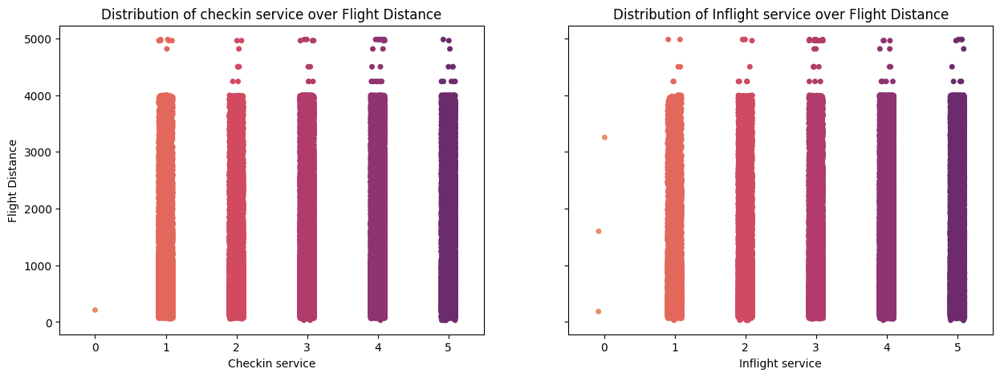

In [29]:
fig , axes = plt.subplots(1,2,figsize=(15,5),sharey=True)
sns.stripplot(ax=axes[0],x=train['Checkin service'],y=train['Flight Distance'],palette='flare')
axes[0].set_title('Distribution of checkin service over Flight Distance')
sns.stripplot(ax=axes[1],x=train['Inflight service'],y=train['Flight Distance'],palette='flare')
axes[1].set_title('Distribution of Inflight service over Flight Distance')

In [30]:
fig = px.scatter(train,x='Departure Delay in Minutes',y='Arrival Delay in Minutes',color='satisfaction',color_discrete_map={'satisfied':'lightblue','neutral or dissatisfied':'#E44242'})
fig.update_layout(title='<b>Distribution of Departure Delay in Minutes over Arrival Delay in Minutes According to satisfaction <b>',title_font={'size':25},paper_bgcolor='darkgrey',plot_bgcolor='darkgrey',showlegend=True)

In [31]:
fig = px.sunburst(train,path=['satisfaction','Gender','Customer Type','Type of Travel','Class'],color='satisfaction',color_discrete_map={'satisfied':'lightblue','neutral of dissatisfied':'#E44242'})
fig.update_layout(title='<b>Distribution of all non-numerical columns according to passengers satisfaction<b>',title_font={'size':25},paper_bgcolor='darkgrey',plot_bgcolor='darkgrey',height=800)

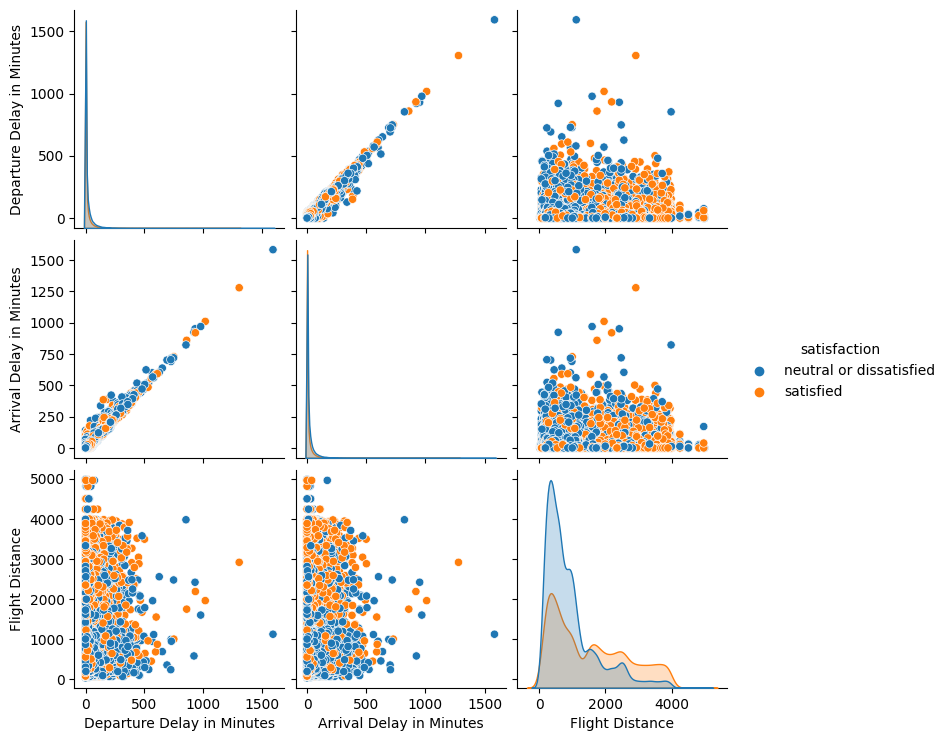

In [32]:
pp = train[['Departure Delay in Minutes','Arrival Delay in Minutes','Flight Distance','satisfaction']]
sns.pairplot(data=pp,hue='satisfaction')

In [33]:
train.pivot_table(index='satisfaction',columns='Gender',values='Flight Distance',aggfunc='mean').style.background_gradient(cmap='Blues')

Gender,Female,Male
satisfaction,,
neutral or dissatisfied,926.917762,931.027365
satisfied,1527.814059,1532.470899


array([<Axes: ylabel='Female'>, <Axes: ylabel='Male'>], dtype=object)

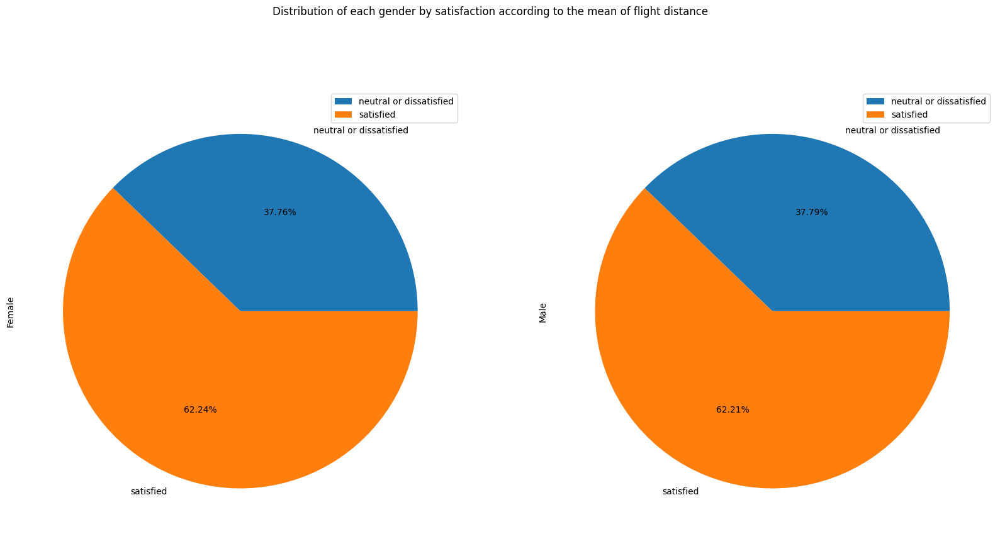

In [34]:
train.pivot_table(index='satisfaction',columns='Gender',values='Flight Distance',aggfunc='mean').plot.pie(subplots=True,autopct='%1.2f%%',title='Distribution of each gender by satisfaction according to the mean of flight distance',figsize=(20,10))

In [35]:
train.pivot_table(index='satisfaction',columns='Class',values='Flight Distance',aggfunc='mean').style.background_gradient(cmap='Blues')

Class,Business,Eco,Eco Plus
satisfaction,,,
neutral or dissatisfied,1422.749095,755.787614,767.477876
satisfied,1787.498521,689.450293,684.766269


array([<Axes: ylabel='Business'>, <Axes: ylabel='Eco'>,
       <Axes: ylabel='Eco Plus'>], dtype=object)

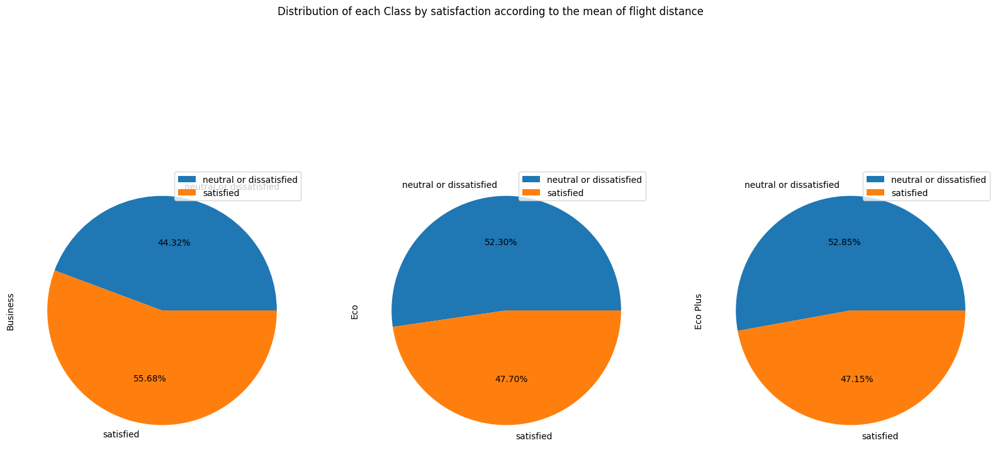

In [36]:
train.pivot_table(index='satisfaction',columns='Class',values='Flight Distance',aggfunc='mean').plot.pie(subplots=True,autopct='%1.2f%%',title='Distribution of each Class by satisfaction according to the mean of flight distance',figsize=(20,10))

Text(0.5, 1.0, 'Distribution of each class by satisfaction according to the mean of flight distance')

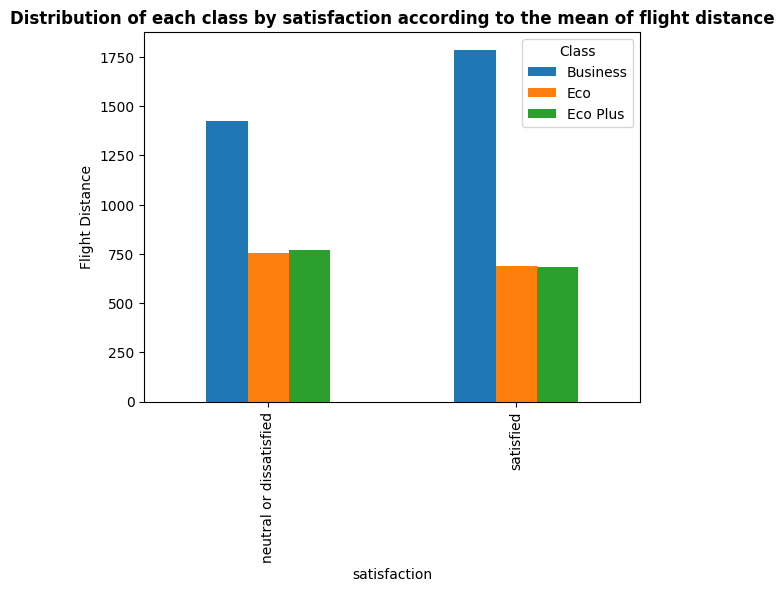

In [37]:
train.pivot_table(index='satisfaction',columns='Class',values='Flight Distance',aggfunc='mean').plot.bar()
plt.ylabel('Flight Distance')
plt.title('Distribution of each class by satisfaction according to the mean of flight distance',fontweight='bold')

In [38]:
train.head(3)

,id,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,...,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes,satisfaction
0,70172,Male,Loyal Customer,13,Personal Travel,Eco Plus,460,3,4,3,...,5,4,3,4,4,5,5,25,18.0,neutral or dissatisfied
1,5047,Male,disloyal Customer,25,Business travel,Business,235,3,2,3,...,1,1,5,3,1,4,1,1,6.0,neutral or dissatisfied
2,110028,Female,Loyal Customer,26,Business travel,Business,1142,2,2,2,...,5,4,3,4,4,4,5,0,0.0,satisfied


In [39]:
for data in all_data :
  data.drop(columns=['id'],inplace=True)

In [40]:
train.columns

Index(['Gender', 'Customer Type', 'Age', 'Type of Travel', 'Class',
       'Flight Distance', 'Inflight wifi service',
       'Departure/Arrival time convenient', 'Ease of Online booking',
       'Gate location', 'Food and drink', 'Online boarding', 'Seat comfort',
       'Inflight entertainment', 'On-board service', 'Leg room service',
       'Baggage handling', 'Checkin service', 'Inflight service',
       'Cleanliness', 'Departure Delay in Minutes', 'Arrival Delay in Minutes',
       'satisfaction'],
      dtype='object')

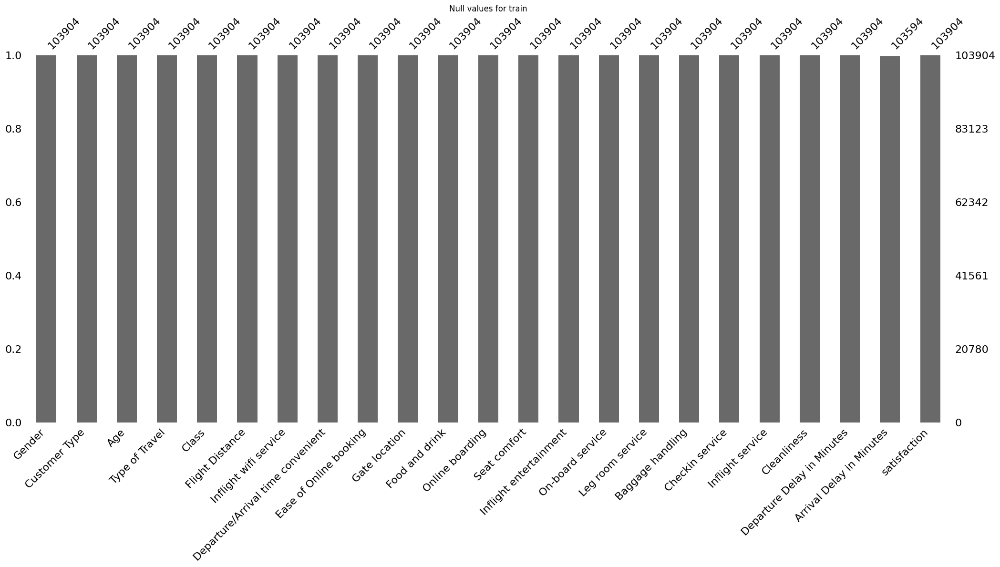

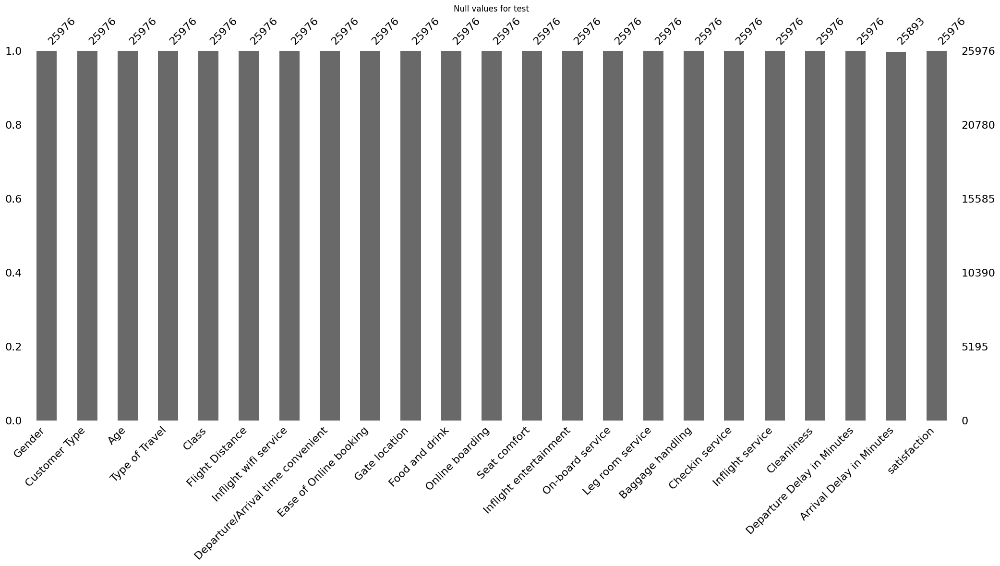

In [41]:
import missingno as msno
for data , name in zip(all_data,data_names) :
  msno.bar(data)
  plt.title(f'Null values for {name}')
  plt.show()

In [42]:
filling_value = train['Arrival Delay in Minutes'].mean()
for data in all_data :
  data['Arrival Delay in Minutes'].fillna(f'{filling_value:.1f}',inplace=True)

In [43]:
for data in all_data :
  data['Arrival Delay in Minutes'] = data['Arrival Delay in Minutes'].astype(float)

In [44]:
for data,name in zip(all_data,data_names) :
  print(f'The Null values of {name} is : \n')
  print(data.isnull().sum())
  print(' ')

The Null values of train is : 

Gender                               0
Customer Type                        0
Age                                  0
Type of Travel                       0
Class                                0
Flight Distance                      0
Inflight wifi service                0
Departure/Arrival time convenient    0
Ease of Online booking               0
Gate location                        0
Food and drink                       0
Online boarding                      0
Seat comfort                         0
Inflight entertainment               0
On-board service                     0
Leg room service                     0
Baggage handling                     0
Checkin service                      0
Inflight service                     0
Cleanliness                          0
Departure Delay in Minutes           0
Arrival Delay in Minutes             0
satisfaction                         0
dtype: int64
 
The Null values of test is : 

Gender                   

In [45]:
for data , name in zip(all_data,data_names) :
  print(f'Duplicated rows {name}: {data.duplicated().sum()}')

Duplicated rows train: 0
Duplicated rows test: 0


In [46]:
to_categorical = ['Gender','Customer Type','Type of Travel','Class','satisfaction']
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
for label in to_categorical :
  train[label] = le.fit_transform(train[label])
  test[label] = le.fit_transform(test[label])

In [47]:
train.head(3)

,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,Gate location,...,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes,satisfaction
0,1,0,13,1,2,460,3,4,3,1,...,5,4,3,4,4,5,5,25,18.0,0
1,1,1,25,0,0,235,3,2,3,3,...,1,1,5,3,1,4,1,1,6.0,0
2,0,0,26,0,0,1142,2,2,2,2,...,5,4,3,4,4,4,5,0,0.0,1


In [48]:
train['Age cat'] = pd.cut(train['Age'],4).sort_values(ascending=True)
train['Flight Dis cat'] = pd.cut(train['Flight Distance'],5)
train['Departure Delay'] = pd.cut(train['Departure Delay in Minutes'],5)
train['Arrival Delay'] = pd.cut(train['Arrival Delay in Minutes'],4)

In [49]:
train[['Age cat','satisfaction']].groupby(['Age cat'],as_index=False).mean().sort_values(by='satisfaction',ascending=False)

,Age cat,satisfaction
2,"(46.0, 65.5]",0.529577
1,"(26.5, 46.0]",0.471743
0,"(6.922, 26.5]",0.284234
3,"(65.5, 85.0]",0.183724


In [50]:
fig = px.histogram(train,x='satisfaction',facet_col='Age cat',barmode='group',color='satisfaction')
fig.update_layout(title='<b>Distribution of average age groups in terms of satisfaction<b>',title_font={'size':25},paper_bgcolor='darkgrey',plot_bgcolor='darkgrey',showlegend=True)
fig.update_traces(opacity=0.7)

In [51]:
train[['Flight Dis cat','satisfaction']].groupby('Flight Dis cat',as_index=False).mean().sort_values(by='satisfaction',ascending=False)

,Flight Dis cat,satisfaction
3,"(3002.2, 3992.6]",0.775289
4,"(3992.6, 4983.0]",0.709677
2,"(2011.8, 3002.2]",0.646339
1,"(1021.4, 2011.8]",0.468915
0,"(26.048, 1021.4]",0.329467


In [52]:
fig = px.histogram(train,x='satisfaction',facet_col='Flight Dis cat',color='satisfaction')
fig.update_layout(title='<b>Distribution of Average Flight Distance in terms of satisfaction<b>',title_font={'size':25},paper_bgcolor='darkgrey',plot_bgcolor='darkgrey')
fig.update_traces(opacity=0.7)

In [53]:
train[['Departure Delay','satisfaction']].groupby('Departure Delay',as_index=False).mean().sort_values(by='satisfaction',ascending=False)

,Departure Delay,satisfaction
3,"(955.2, 1273.6]",0.500000
4,"(1273.6, 1592.0]",0.500000
0,"(-1.592, 318.4]",0.433431
1,"(318.4, 636.8]",0.387978
2,"(636.8, 955.2]",0.250000


In [54]:
fig = px.histogram(train,x='satisfaction',facet_col='Departure Delay',color='satisfaction',barmode='group')
fig.update_layout(title='<b>Distribution of Average Departure Delay in terms of satisfaction<b>',title_font={'size':25},paper_bgcolor='darkgrey',plot_bgcolor='darkgrey')
fig.update_traces(opacity=0.7)

In [55]:
train[['Arrival Delay','satisfaction']].groupby('Arrival Delay',as_index=False).mean().sort_values(by='satisfaction',ascending=False)

,Arrival Delay,satisfaction
3,"(1188.0, 1584.0]",0.500000
0,"(-1.584, 396.0]",0.433385
2,"(792.0, 1188.0]",0.428571
1,"(396.0, 792.0]",0.365854


In [56]:
fig = px.histogram(train,x='satisfaction',facet_col='Arrival Delay',color='satisfaction',barmode='group')
fig.update_layout(title='<b>Distribution of Arrival Delay average in terms of satisfaction<b>',title_font={'size':25},paper_bgcolor='darkgrey',plot_bgcolor='darkgrey')
fig.update_traces(opacity=0.7)

In [57]:
train.drop(columns=['Age cat','Flight Dis cat','Arrival Delay','Departure Delay'],inplace=True)

In [58]:
to_category = ['Age','Flight Distance','Departure Delay in Minutes','Arrival Delay in Minutes']
for col in to_category :
  train[col] = pd.cut(train[col],4,labels=[1,2,3,4])
  test[col] = pd.cut(test[col],4,labels=[1,2,3,4])

In [59]:
train.head(3)

,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,Gate location,...,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes,satisfaction
0,1,0,1,1,2,1,3,4,3,1,...,5,4,3,4,4,5,5,1,1,0
1,1,1,1,0,0,1,3,2,3,3,...,1,1,5,3,1,4,1,1,1,0
2,0,0,1,0,0,1,2,2,2,2,...,5,4,3,4,4,4,5,1,1,1


In [60]:
train.Age.value_counts()

2    43316
3    31680
1    24902
4     4006
Name: Age, dtype: int64

In [61]:
for col in to_category :
  train[col] = train[col].astype(int)
  test[col] = test[col].astype(int)

Text(0.5, 1.0, 'Data Correlation.')

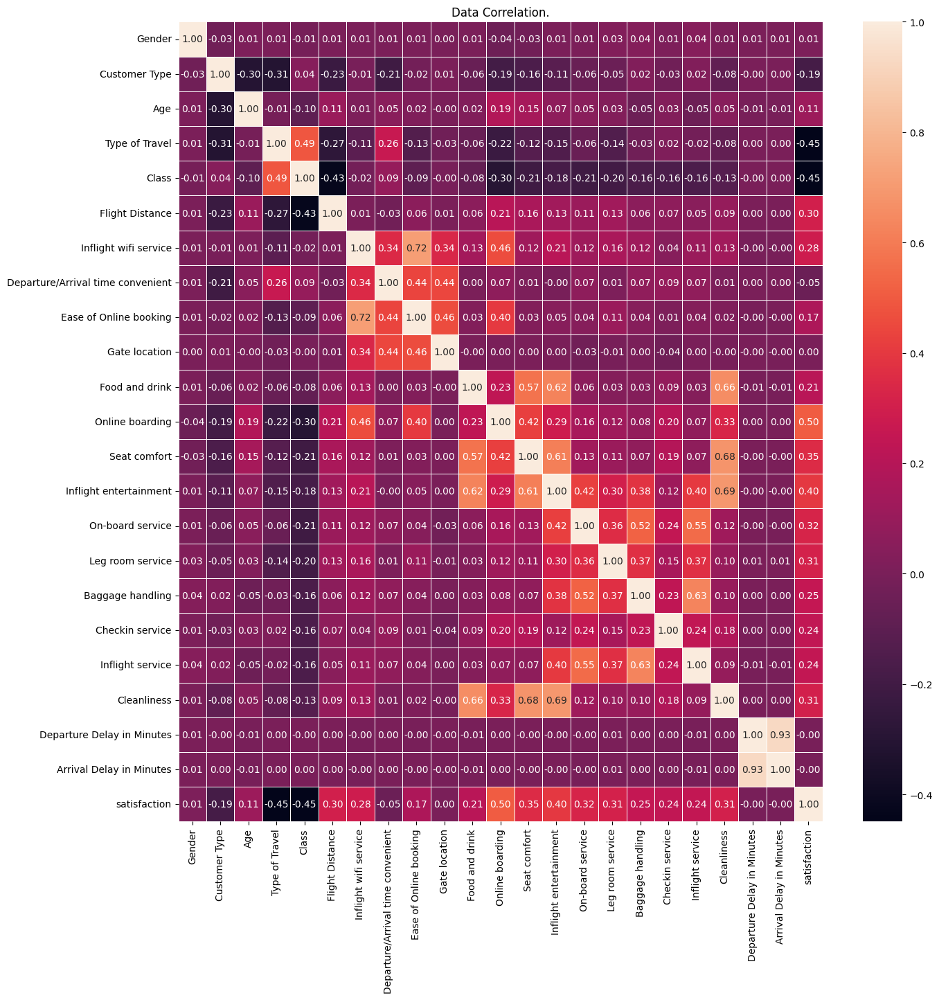

In [62]:
correlation = train.corr()
plt.figure(figsize=(15,15))
sns.heatmap(correlation,annot=True,fmt='.2f',annot_kws={'size':10},linewidths=0.5)
plt.title('Data Correlation.')

Text(0.5, 1.0, 'Maximum 8 features affect the target (satisfaction)')

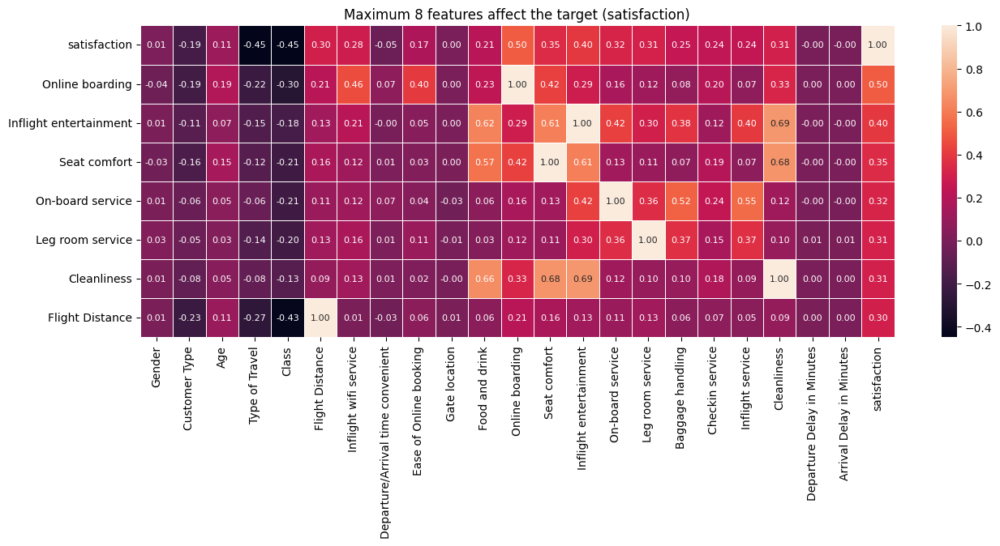

In [63]:
max_8_corr = correlation.nlargest(8,'satisfaction')
plt.figure(figsize=(15,5))
sns.heatmap(max_8_corr,annot=True,fmt='.2f',annot_kws={'size':8},linewidths=0.5)
plt.title('Maximum 8 features affect the target (satisfaction)')

In [64]:
X_train = train.drop(['satisfaction'],axis=1)
y_train = train['satisfaction']

X_test = test.drop(['satisfaction'],axis=1)
y_test = test['satisfaction']

In [67]:
from pycaret.classification import *
s = setup(train,target='satisfaction')

,Description,Value
0,Session id,8411
1,Target,satisfaction
2,Target type,Binary
3,Original data shape,"(103904, 23)"
4,Transformed data shape,"(103904, 23)"
5,Transformed train set shape,"(72732, 23)"
6,Transformed test set shape,"(31172, 23)"
7,Numeric features,22
8,Preprocess,True
9,Imputation type,simple


In [68]:
from xgboost import XGBClassifier
XGB = XGBClassifier()
XGB.fit(X_train,y_train)

print('XGBClassifier training score : ',XGB.score(X_train,y_train))
print('XGBClassifier testing score : ',XGB.score(X_test,y_test))

XGB_score_test = round(XGB.score(X_test,y_test)*100,2)
XGB_prediction = XGB.predict(X_test)

XGBClassifier training score :  0.9713389282414536
XGBClassifier testing score :  0.962696335078534


In [69]:
from sklearn.linear_model import LogisticRegression
LR = LogisticRegression()
LR.fit(X_train,y_train)
print('LR training score : ',LR.score(X_train,y_train))
print('LR testing score : ',LR.score(X_test,y_test))

LR_score_test = round(LR.score(X_test,y_test)*100,2)
LR_prediction = LR.predict(X_test)

LR training score :  0.8750866184170003
LR testing score :  0.8705343393902063


In [70]:
from sklearn.ensemble import GradientBoostingClassifier
GBC = GradientBoostingClassifier()
GBC.fit(X_train,y_train)
print('GBC training score : ',GBC.score(X_train,y_train))
print('GBC testing score : ',GBC.score(X_test,y_test))
GBC_score_test = round(GBC.score(X_test,y_test)*100,2)
GBC_prediction = GBC.predict(X_test)

GBC training score :  0.9414267015706806
GBC testing score :  0.9420234062211272


In [74]:
from catboost import CatBoostClassifier
CBC = CatBoostClassifier()
CBC.fit(X_train,y_train)
print('CBC training score : ',CBC.score(X_train,y_train))
print('CBC testing score : ',CBC.score(X_test,y_test))

CBC_score_test = round(CBC.score(X_test,y_test)*100,2)
CBC_prediction = CBC.predict(X_test)

Learning rate set to 0.074823
0:	learn: 0.5936311	total: 75.6ms	remaining: 1m 15s
1:	learn: 0.4956086	total: 105ms	remaining: 52.4s
2:	learn: 0.4383630	total: 142ms	remaining: 47.1s
3:	learn: 0.3899771	total: 169ms	remaining: 42s
4:	learn: 0.3553702	total: 202ms	remaining: 40.2s
5:	learn: 0.3251352	total: 228ms	remaining: 37.8s
6:	learn: 0.3029365	total: 255ms	remaining: 36.1s
7:	learn: 0.2832906	total: 288ms	remaining: 35.8s
8:	learn: 0.2610528	total: 316ms	remaining: 34.8s
9:	learn: 0.2404413	total: 342ms	remaining: 33.9s
10:	learn: 0.2289825	total: 370ms	remaining: 33.3s
11:	learn: 0.2200628	total: 398ms	remaining: 32.7s
12:	learn: 0.2087985	total: 427ms	remaining: 32.4s
13:	learn: 0.2022164	total: 455ms	remaining: 32.1s
14:	learn: 0.1964070	total: 481ms	remaining: 31.6s
15:	learn: 0.1895481	total: 509ms	remaining: 31.3s
16:	learn: 0.1851194	total: 537ms	remaining: 31.1s
17:	learn: 0.1821384	total: 565ms	remaining: 30.8s
18:	learn: 0.1784866	total: 591ms	remaining: 30.5s
19:	learn: 

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
KNN = KNeighborsClassifier()
KNN.fit(X_train,y_train)
print('KNN training set score : ',KNN.score(X_train,y_train))
print('KNN testing set score : ',KNN.score(X_test,y_test))
KNN_score_test = round(KNN.score(X_test,y_test)*100,2)
KNN_prediction = KNN.predict(X_test)

In [ ]:
models = pd.DataFrame({'Model':['XGB Classifier','logistic regression','Gradient Boosting Classifier','CatBoostClassifier','KNN'],'Score':[XGB_score_test,LR_score_test,GBC_score_test,CBC_score_test,KNN_score_test]})
models.sort_values(by='Score',ascending=False).style.backgroud_gradient(cmap='Blues')

In [ ]:
from sklearn.metrics import confusion_matrix

models_prediction = [XGB_prediction,LR_prediction,GBC_prediction,CBC_prediction,KNN_prediction]
for n , model in enumerate(models_prediction) :
  cm = confusion_matrix(y_test,model)
  sns.heatmap(cm,annot=True,linewidths=3,cmap='Blues')
